In [1]:
# Dependencies (feel free to change for your setup)
!sudo apt-get install -y ffmpeg --quiet
!pip install librosa --quiet
!pip install torchvision --quiet
!pip install torchaudio --quiet

In [48]:
# Imports

import torch
import torch.nn as nn
import torchaudio
import torchvision
import torchaudio.transforms as aT
import torchvision.transforms as vT
from torchvision.transforms import Grayscale
import torchvision.transforms.functional as vF

from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Audio
import librosa
import librosa.display
import os

from PIL import Image
from PIL import ImageEnhance, ImageFilter



print(f'PyTorch {torch.__version__} --- tested on 1.9.0') 
print(f'torchvision {torchvision.__version__} --- tested on 0.10.0')
print(f'torchaudio {torchaudio.__version__} --- tested on 0.9.0a0+33b2469')


PyTorch 1.9.0 --- tested on 1.9.0
torchvision 0.10.0 --- tested on 0.10.0
torchaudio 0.9.0a0+33b2469 --- tested on 0.9.0a0+33b2469


In [59]:
# Helper functions

import random

def set_seed(seed=None, seed_torch=True):
  if seed is None:
    seed = np.random.choice(2 ** 32)
  random.seed(seed)
  np.random.seed(seed)
  if seed_torch:
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

  print(f'Random seed {seed} has been set.')


# In case that `DataLoader` is used
def seed_worker(worker_id):
  worker_seed = torch.initial_seed() % 2**32
  np.random.seed(worker_seed)
  random.seed(worker_seed)

def set_device():
  device = "cuda" if torch.cuda.is_available() else "cpu"
  if device != "cuda":
    print("WARNING: For this notebook to perform best, "
        "if possible, in the menu under `Runtime` -> "
        "`Change runtime type.`  select `GPU` ")
  else:
    print("GPU is enabled in this notebook.")

  return device


try:
    from tkinter import Tk
    from tkFileDialog import askopenfilenames
except:
    from tkinter import Tk
    from tkinter import filedialog

def choose_file():
    Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
    filenames = filedialog.askopenfilenames() # show an "Open" dialog box and return the path to the selected file
    return filenames[0]

import matplotlib.image as im

def choose_image(as_numpy=True):
    path = choose_file()
    img = Image.open(path)
    
    if as_numpy:
        img = np.asarray(img)
        img = img[:,:,:3] # PNGs often have an alpha channel, remove it

    print("Image loaded from: ", path)
    return img

set_seed(2021)
DEVICE = set_device()


    


Random seed 2021 has been set.
GPU is enabled in this notebook.


In [60]:
# Helper Functions for Data Understanding

def plot_waveform(waveform, sample_rate, title="Waveform", xlim=None, ylim=None):
  waveform = waveform.numpy()
  num_channels, num_frames = waveform.shape
  time_axis = torch.arange(0, num_frames) / sample_rate

  figure, axes = plt.subplots(num_channels, 1)
  if num_channels == 1:
    axes = [axes]
  for c in range(num_channels):
    axes[c].plot(time_axis, waveform[c], linewidth=1)
    axes[c].grid(True)
    if num_channels > 1:
      axes[c].set_ylabel(f'Channel {c+1}')
    if xlim:
      axes[c].set_xlim(xlim)
    if ylim:
      axes[c].set_ylim(ylim)
  figure.suptitle(title)
  plt.show(block=False)

def stat_img(img, origin='upper', gray=False, id=None, autoscale=False, axes=False, stats=True):
    if id is None:
        id = "Image"
    
    if type(img) == Image.Image:
        img = np.array(img)
    elif type(img) == torch.Tensor:
        img = img.numpy()

    if stats:
        print(f"{id}:  {type(img)} of shape {img.shape} and dtype {img.dtype}")
        print(f"{id}:  max: {img.max():.6f}  min: {img.min():.6f}  mean: {img.mean():.6f}  std: {img.std():.6f}")
    
    if not axes:
        plt.axis('off')
    
    if not autoscale:
        vmin, vmax = 0.0, 1.0
        if gray:
            plt.imshow(img, origin=origin, cmap='gray', vmin=vmin, vmax=vmax)
        else:
            plt.imshow(img, origin=origin, vmin=vmin, vmax=vmax)
    else:
        if gray:
            plt.imshow(img, origin=origin, cmap='gray')
        else:
            plt.imshow(img, origin=origin)
    
    plt.show()    

def minmax_scale(arr):
    if type(arr) == torch.Tensor:
        maxi = arr.max().item()
        mini = arr.min().item()
    else: # assume it's a numpy array
        maxi = arr.max()
        mini = arr.min()
        
    return (arr - mini) / (maxi-mini), mini, maxi

def invert_minmax_scale(arr, minimum, maximum):
    return arr * (maximum-minimum) + minimum

def minmax_scale_log(arr):
    return minmax_scale(np.log(arr + 1))

def invert_minmax_scale_log(arr, mini, maxi):
    return np.exp(invert_minmax_scale(arr, mini, maxi))-1


def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None, todb=False):
  fig, axs = plt.subplots(1, 1)
  axs.set_title(title or 'Spectrogram (db)')
  axs.set_ylabel(ylabel)
  axs.set_xlabel('frame')
  if todb:
    spec = librosa.power_to_db(spec)
  im = axs.imshow(spec, origin='lower', aspect=aspect)
  if xmax:
    axs.set_xlim((0, xmax))
  fig.colorbar(im, ax=axs)
  plt.show(block=False)

def play_audio(waveform, samplerate):
  if type(waveform) == torch.Tensor:
      waveform = waveform.numpy()

  num_channels, num_frames = waveform.shape
  if num_channels == 1:
    display(Audio(data=waveform, rate=samplerate))
  elif num_channels == 2:
    display(Audio(data=(waveform[0], waveform[1]), rate=samplerate))
  else:
    raise ValueError("Waveform with more than 2 channels are not supported.")

def stft2wav(spec, n_fft=1024, hop_length=256, sample_rate=22050, win_length=None, plot_wave=False, show_player=True):
    if type(spec) == Image.Image:
        spec = np.array(spec)
    
    resynth_griffin_lim = aT.GriffinLim(
        n_fft=n_fft,
        win_length=win_length,
        hop_length=hop_length,
    )
    print(f"Input image shape {spec.shape}")
    if len(spec.shape) == 2:
        spec = np.expand_dims(spec, 2)
    synthesized_waveform = resynth_griffin_lim(torch.from_numpy(spec).permute(2, 0, 1))
    if plot_wave:
        plot_waveform(synthesized_waveform, sample_rate, title="Synthesized Waveform from STFT")
    if show_player:
        play_audio(synthesized_waveform, sample_rate)
    return synthesized_waveform

def mel2stft(melspec, n_fft=1024, n_mels=128, sample_rate=22050, tolerance_loss=1.0):
    n_stft = int(n_fft/2) + 1

    if type(melspec) == np.ndarray:
        melspec = torch.from_numpy(melspec.astype('float32'))
        
    print(f"Building STFT from Mel Spectrogram (tolerance:{tolerance_loss}) ... This can take a while!")
    resynth_stft = torchaudio.transforms.InverseMelScale(
        n_stft=n_stft, 
        n_mels=n_mels, 
        sample_rate=sample_rate,
        tolerance_loss=tolerance_loss
    )
    result = resynth_stft(melspec)
    print("Done!")
    return result


# Reconstruction of Waveforms

## Problems with Inverse Mel Spectrograms

The Inverse Mel Spectrogram algorithm provided by torchaudio produces rather noisy STFT spectrograms.
Even when given a Mel Spectrogram of all zeros, the inverse Mel operation delivers a noisy STFT.

Mel Zeros:  <class 'numpy.ndarray'> of shape (128, 800) and dtype float64
Mel Zeros:  max: 0.000000  min: 0.000000  mean: 0.000000  std: 0.000000


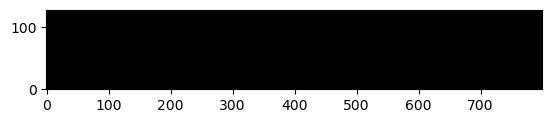

Building STFT from Mel Spectrogram (tolerance:1.0) ... This can take a while!
Done!
Mel Zeros STFT:  <class 'numpy.ndarray'> of shape (513, 800) and dtype float32
Mel Zeros STFT:  max: 0.999872  min: 0.000000  mean: 0.022206  std: 0.065656


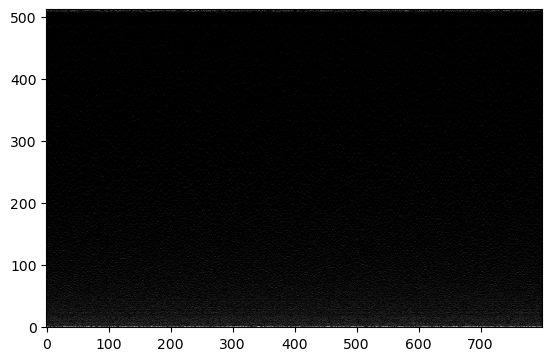

Input image shape torch.Size([513, 800])



Yikes.. the Inverse Mel transform results in a VERY noisy STFT!



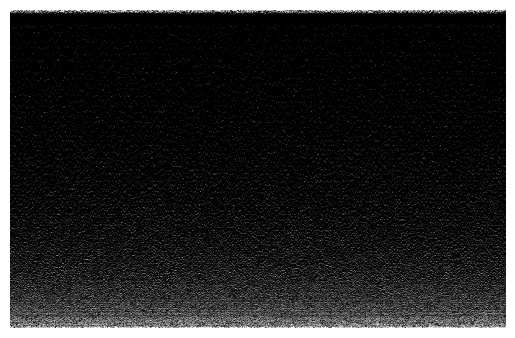


Even if all the data smaller than 0.3 is thrown out, there is high amplitude noise in the low and high frequencies...

STFT Values >= 0.3:  <class 'numpy.ndarray'> of shape (513, 800) and dtype float32
STFT Values >= 0.3:  max: 0.999872  min: 0.000000  mean: 0.003943  std: 0.048006


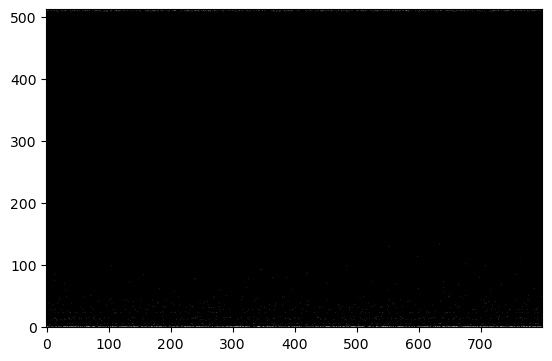

Input image shape torch.Size([513, 800])


In [61]:
sample_rate = 22050
n_fft = 1024
hop_length = 256
stft_bins = int(n_fft / 2) + 1
mel_bins = 128
num_frames = int(sample_rate / hop_length)

# Mel Spectrograms

n_frames = 800

# MEL zeros
mel_zeros = np.zeros((mel_bins, n_frames))
stat_img(mel_zeros, gray=True, origin='lower', id='Mel Zeros', axes=True)
stft = mel2stft(mel_empty, tolerance_loss=1.0, n_fft=n_fft, n_mels=mel_bins, sample_rate=sample_rate)
stat_img(stft, gray=True, origin='lower', id='Mel Zeros STFT', axes=True) # STFT gets a lot of noise...
wav = stft2wav(stft)

print("\nYikes.. the Inverse Mel transform results in a VERY noisy STFT!\n")

# Apply Contrast Filter to Resulting STFT to better see the noise
stft_scaled, mini, maxi = minmax_scale_log(stft)
img = vF.to_pil_image(stft)
cont = ImageEnhance.Contrast(img)
cont_img = cont.enhance(5)
cont_img = np.array(cont_img)/255.0
stat_img(cont_img, origin='lower', gray=True, stats=False)

# reduce all the small values...
thresh = 0.3
print(f"\nEven if all the data smaller than {thresh} is thrown out, there is high amplitude noise in the low and high frequencies...\n")
stft[stft < thresh] = 0.0
stat_img(stft, gray=True, origin='lower', id=f'STFT Values >= {thresh}', axes=True) # STFT gets a lot of noise...
wav = stft2wav(stft)



# # Mel ones
# mel_white = np.ones((mel_bins, n_frames))
# stat_img(mel_white, gray=True, origin='lower', id='Mel Ones', axes=True)
# stft = mel2stft(mel_empty, tolerance_loss=1.0, n_fft=n_fft, n_mels=mel_bins, sample_rate=sample_rate)
# stat_img(stft, gray=True, origin='lower', id='Mel Ones STFT', axes=True) # STFT gets a lot of noise...
# wav = stft2wav(stft)


STFT Mag Zeros:  <class 'numpy.ndarray'> of shape (513, 800) and dtype float64
STFT Mag Zeros:  max: 0.000000  min: 0.000000  mean: 0.000000  std: 0.000000


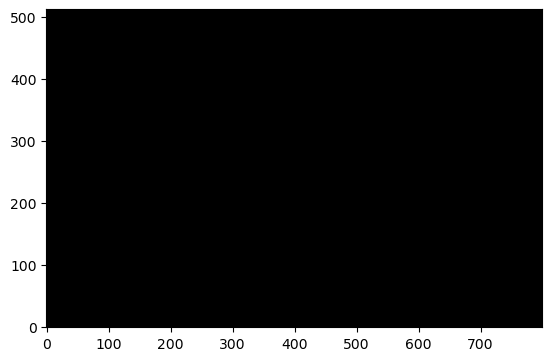

Input image shape (513, 800)


STFT Mag Ones:  <class 'numpy.ndarray'> of shape (513, 800) and dtype float64
STFT Mag Ones:  max: 1.000000  min: 1.000000  mean: 1.000000  std: 0.000000


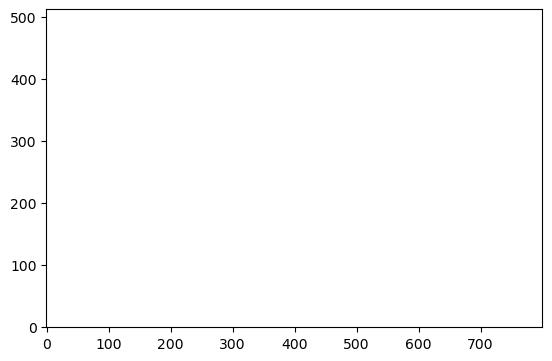

Input image shape (513, 800)


In [47]:
# STFT Spectrograms

# STFT Mag Zeros
stft_mag_zeros = np.zeros((stft_bins, n_frames))
stat_img(stft_zeros, gray=True, origin='lower', id='STFT Mag Zeros', axes=True)
wav = stft2wav(stft_zeros)

# STFT Mag Ones
stft_mag_ones = np.ones((stft_bins, n_frames))
stat_img(stft_ones, gray=True, origin='lower', id='STFT Mag Ones', axes=True)
wav = stft2wav(stft_ones)



waveform in torch.Size([220500])  complex stft out torch.Size([513, 862])
index 0,0 (-4.590386390686035+0j) // -4.590386390686035, 0.0 
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float32
Image:  max: 1.000000  min: 0.000000  mean: 0.853716  std: 0.004553


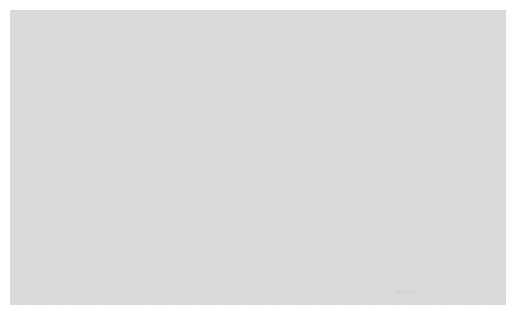

# STFT

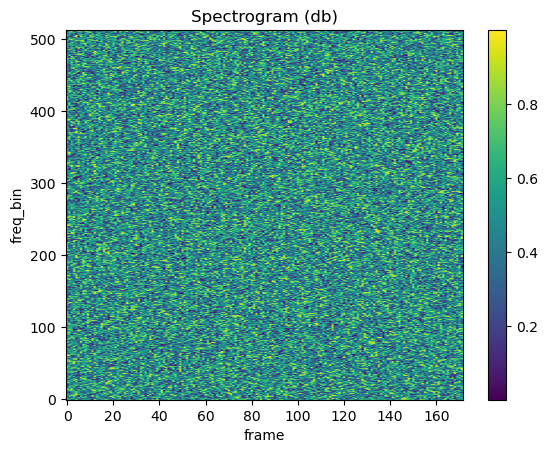

(513, 172, 1) <class 'numpy.ndarray'>
Input image shape (513, 172, 1)


In [5]:
# Uniform Noise
img_noise = np.random.rand(num_bins, num_frames * 2 , 1)
plot_spectrogram(img_noise)
print(img_noise.shape, type(img_noise))
waveform = stft2wav(img_noise)

Image loaded from:  /home/jon/Drive/LEVERHULME/COURSES/NEUROMATCH2021/HallucinatingGANs/Code/data/inputs/zigzag.png
<class 'numpy.ndarray'> (513, 1011)


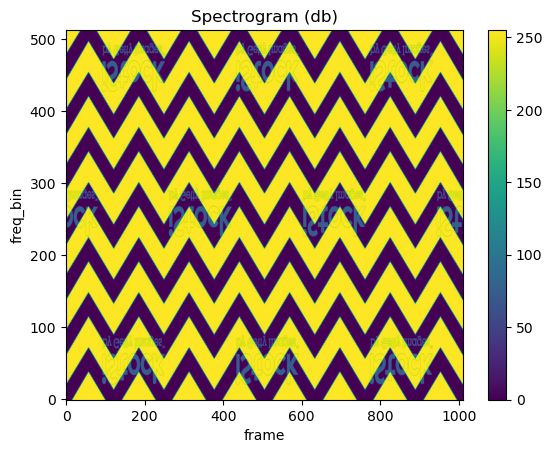

(513, 1011) <class 'numpy.ndarray'>
Input image shape (513, 1011)


In [6]:
# An arbitrary image
img = choose_image()
#img = clip_image(img, y=513, mode='center')

left = 0
right = img.shape[1]
height = 513
top = int((img.shape[0] - height) / 2)
bottom = img.shape[0] - top

# Do processing - torchvision uses PIL internally for image manipulations
img = Image.fromarray(img) # convert nparray to PIL so we can use torchaudio transforms directly

graycrop = vT.Compose([vT.Grayscale(1), vT.CenterCrop([513, right])])
img = graycrop(img)

img = np.asarray(img) # convert back to numpy

print(type(img), img.shape)

plot_spectrogram(img)
print(img.shape, type(img))
waveform = stft2wav(img)


In [ ]:
# Generated Patterns

In [14]:
# Load gztan
gztan = torchaudio.datasets.GTZAN(os.path.abspath('./data'), download=False)

Unmodified STFT - not very easy to see details!
Image:  <class 'torch.Tensor'> of shape torch.Size([513, 862]) and dtype torch.float32
Image:  max: 10776.530273  min: 0.000000  mean: 7.150015  std: 93.831581


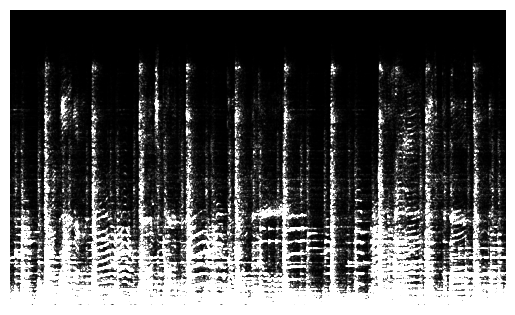

Reconstructed audio...
Input image shape torch.Size([513, 862])




CLIPPED STFT - Strong visual details, but loses a lot of audio information
Image:  <class 'torch.Tensor'> of shape torch.Size([513, 862]) and dtype torch.float32
Image:  max: 1.000000  min: 0.000000  mean: 0.232117  std: 0.359889


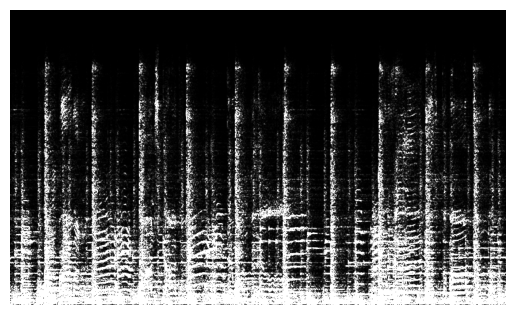

Reconstructed audio...
Input image shape torch.Size([513, 862])




Minmax Scaled Log STFT - Pretty good visual details, can be inverted to reconstruct original spectrogram
Image:  <class 'torch.Tensor'> of shape torch.Size([513, 862]) and dtype torch.float32
Image:  max: 1.000000  min: 0.000000  mean: 0.042552  std: 0.102092


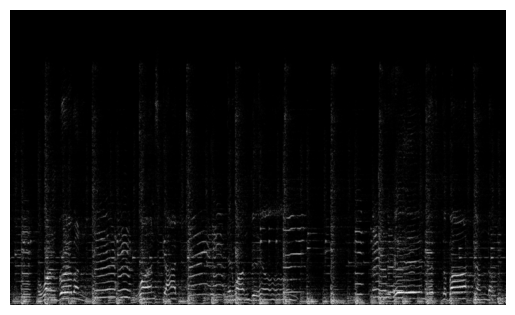

invert minmax scaling & log, then Reconstruct waveform...
Input image shape torch.Size([513, 862])


tensor([[-0.0194, -0.0232, -0.0254,  ...,  0.0016,  0.0076,  0.0146]])

In [15]:
# A wavefile from GZTAN
waveform, sr, label = gztan[0]
num_chan, num_frames = waveform.shape
waveform = waveform.squeeze() # remove the channel dimension
waveform = waveform[:sr*10] # take first 10 seconds

n_fft = 1024
n_mels = 128
win_length = None
hop_length = 256 # smaller hop size leads to better reconstruction but takes longer to compute
power = 2.0 # squared power magnitude spectrogram

get_stft = torchaudio.transforms.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
    center=True,
    pad_mode="reflect",
    power=power,
)
#amp_to_db = torchaudio.transforms.AmplitudeToDB('power')

stft = get_stft(waveform)
#stft_db = amp_to_db(stft)

#stft_tensor = torch.tensor(stft).reshape(3, 513, -1)
#stat_img(stft_tensor.clip(0,1).permute(1,2,0))


# Unmodified STFT
print("Unmodified STFT - not very easy to see details!")
stat_img(stft, origin='lower', gray=True)
print("Reconstructed audio...")
stft2wav(stft)


# very crude method that still preserves structure < 1.0 --- ok for visualization but terrible for reconstruction!
print("\n\nCLIPPED STFT - Strong visual details, but loses a lot of audio information")
stft_clipped = stft.clip(0.0, 1.0)
stat_img(stft_clipped, origin='lower', gray=True)
print("Reconstructed audio...")
stft2wav(stft_clipped)

# (This is probably the best transformation to use while retaining the most valuable visual information...
print("\n\nMinmax Scaled Log STFT - Pretty good visual details, can be inverted to reconstruct original spectrogram")
# NOTE: you must store the maximum and minimum in order to do the inverse scale
stft_minmax, mini, maxi = minmax_scale_log(stft)
stat_img(stft_minmax, origin='lower', gray=True)
print("invert minmax scaling & log, then Reconstruct waveform...")
stft2wav(invert_minmax_scale_log(stft_minmax, mini, maxi))


Applying some image manipulations to spectrograms...
Here we are using the minmax scaled log STFT because of it's improved visual legibility



Original
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 1.000000  min: 0.000000  mean: 0.041244  std: 0.101829


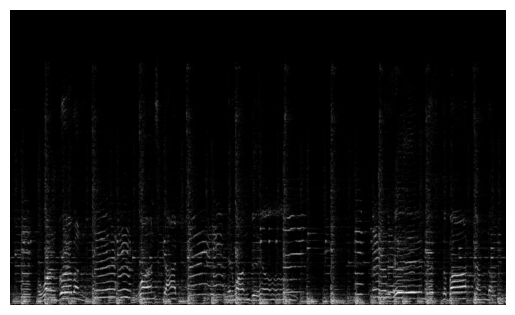

Input image shape (513, 862)






Shuffle X (time)
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 1.000000  min: 0.000000  mean: 0.041244  std: 0.101829


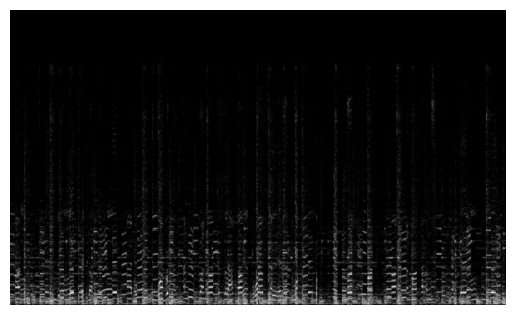

Input image shape (513, 862)






Shuffle Y (frequency bins)
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 1.000000  min: 0.000000  mean: 0.041244  std: 0.101829


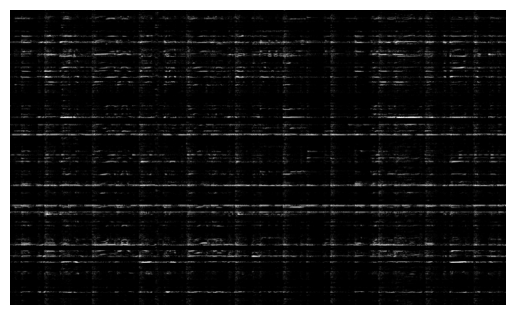

Input image shape (513, 862)






Translation Y
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 1.000000  min: 0.000000  mean: 0.041244  std: 0.101829


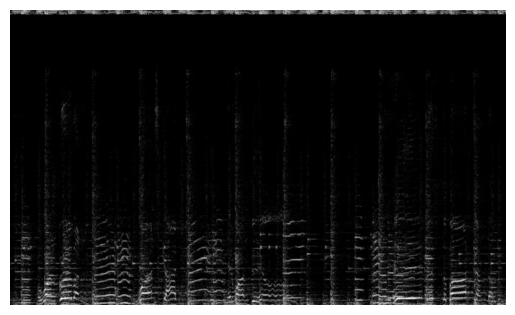

Invertminmax log norm blur
Input image shape (513, 862)


<class 'PIL.ImageEnhance.Sharpness'>




Sharpened x20.0
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 1.000000  min: 0.000000  mean: 0.097814  std: 0.244646


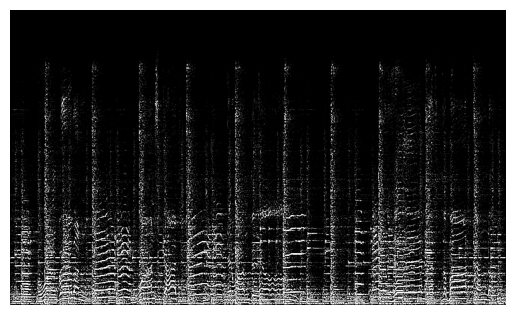

Input image shape (513, 862)


<class 'PIL.ImageEnhance.Contrast'>




Contrast x5
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 1.000000  min: 0.000000  mean: 0.105663  std: 0.267989


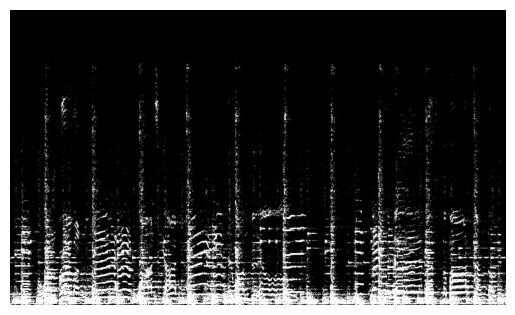

Input image shape (513, 862)






Gaussian Blur strength 3
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 0.545098  min: 0.000000  mean: 0.040948  std: 0.079232


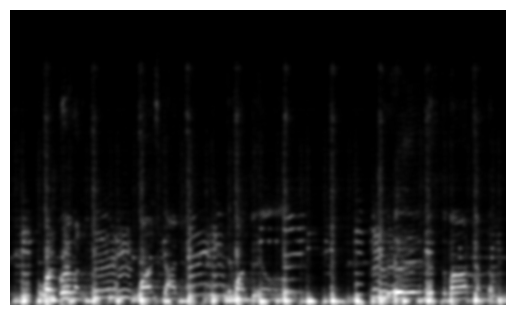

Input image shape (513, 862)






Contour Filter
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 1.000000  min: 0.000000  mean: 0.059965  std: 0.170065


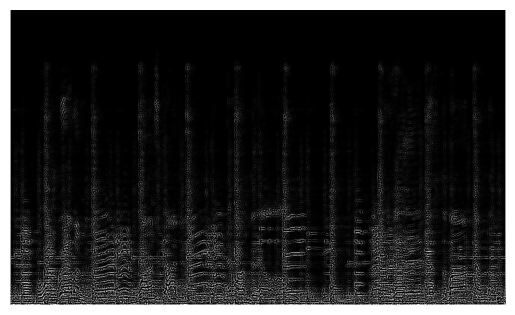

Input image shape (513, 862)


tensor([[ -7.8061, -11.2689,   3.3520,  ...,  -0.0776,  13.1818,   3.1270]],
       dtype=torch.float64)

In [12]:
print("Applying some image manipulations to spectrograms...")
print("Here we are using the minmax scaled log STFT because of it's improved visual legibility\n\n\n")

# Applying image manipulations to spectrograms....
img = vF.to_pil_image(stft_minmax)
print("Original")
stat_img(np.array(img)/255.0, origin='lower', gray=True)
stft2wav(invert_minmax_scale_log(np.array(img)/255.0, mini, maxi))




ts_img = np.array(img)/255.0
print("\n\n\n\nShuffle X (time)")
ts_segments = np.array_split(ts_img, 100, axis=1)
np.random.shuffle(ts_segments)
ts_img = np.concatenate(ts_segments, axis=1)
stat_img(ts_img, origin='lower', gray=True)
ts_img = invert_minmax_scale_log(ts_img, mini, maxi)
stft2wav(ts_img)


fs_img = np.array(img)/255.0
print("\n\n\n\nShuffle Y (frequency bins)")
fs_segments = np.array_split(fs_img, 200, axis=0)
np.random.shuffle(fs_segments)
fs_img = np.concatenate(fs_segments, axis=0)
stat_img(fs_img, origin='lower', gray=True)
fs_img = invert_minmax_scale_log(fs_img, mini, maxi)
stft2wav(fs_img)



tr_img = np.array(img)/255.0
print("\n\n\n\nTranslation Y")
tr_img = np.roll(tr_img, -10, axis=0)
stat_img(tr_img, origin='lower', gray=True)
tr_img = invert_minmax_scale_log(tr_img, mini, maxi)
print("Invertminmax log norm blur")
stft2wav(tr_img)



sharp = ImageEnhance.Sharpness(img)
print(type(sharp))
sharp_img = sharp.enhance(20.0)
print("\n\n\n\nSharpened x20.0")
sharp_img = np.array(sharp_img)/255.0
stat_img(sharp_img, origin='lower', gray=True)
stft2wav(invert_minmax_scale_log(sharp_img, mini, maxi))

cont = ImageEnhance.Contrast(img)
print(type(cont))
cont_img = cont.enhance(5)
print("\n\n\n\nContrast x5")
cont_img = np.array(cont_img)/255.0
stat_img(cont_img, origin='lower', gray=True)
stft2wav(invert_minmax_scale_log(cont_img, mini, maxi))

blur_img = img.filter(ImageFilter.GaussianBlur(3))
print("\n\n\n\nGaussian Blur strength 3")
blur_img = np.array(blur_img)/255.0
stat_img(blur_img, origin='lower', gray=True)
blur_img = invert_minmax_scale_log(blur_img, mini, maxi)
stft2wav(blur_img)


ctr_img = img.filter(ImageFilter.CONTOUR)
print("\n\n\n\nContour Filter")
ctr_img = (255.0-np.array(ctr_img))/255.0
stat_img(ctr_img, origin='lower', gray=True)
ctr_img = invert_minmax_scale_log(ctr_img, mini, maxi)
stft2wav(ctr_img)






0.0 0.999996538142296
Image:  <class 'torch.Tensor'> of shape torch.Size([513, 862]) and dtype torch.float32
Image:  max: 1.000000  min: 0.000000  mean: 0.042552  std: 0.102092


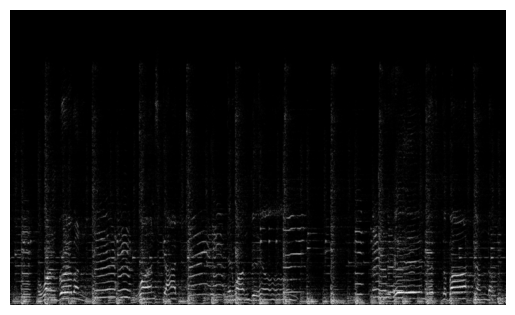

invert minmax scaling & log, then Reconstruct waveform...
Input image shape torch.Size([513, 862])


Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 0.999997  min: 0.000000  mean: 0.000905  std: 0.025793


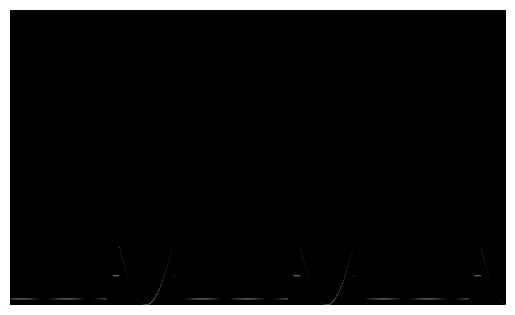

Input image shape (513, 862)






Horizontal Lines, Octave Relationship
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 1.000000  min: 0.000000  mean: 0.013645  std: 0.116013


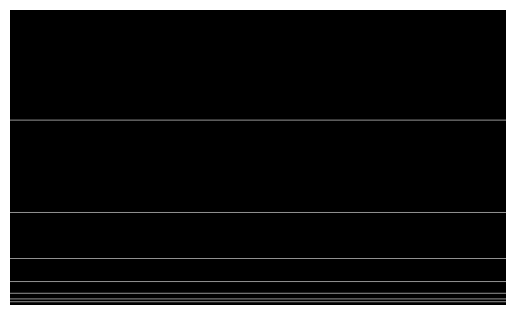

Input image shape (513, 862)






Horizontal Lines with Gaussian Blur
Gaussian Blur strength 3
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 0.188235  min: 0.000000  mean: 0.013592  std: 0.035826


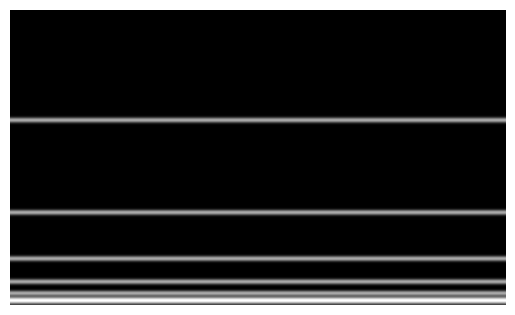

Invertminmax log norm blur
Input image shape (513, 862)






Full Spectrum wave along Time Axis
Image:  <class 'numpy.ndarray'> of shape (513, 862) and dtype float64
Image:  max: 0.999997  min: 0.000005  mean: 0.504453  std: 0.355409


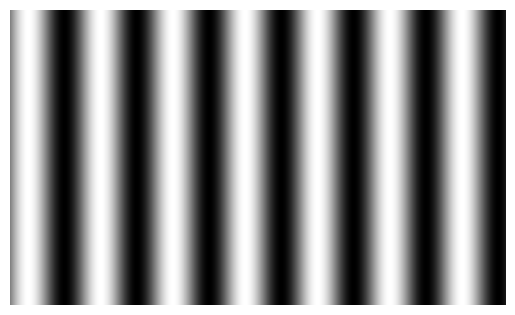

Input image shape (513, 862)


tensor([[ 0.0298,  0.0076,  0.0225,  ..., -0.0222, -0.0059,  0.0049]],
       dtype=torch.float64)

In [16]:
# Generate Test Input Images


# Sinusoidal Pattern
sinus_img = np.zeros((513, 862))
for i in np.arange(0, 862):
    idx = int(512*((np.sin(i * 0.02) + 1)/2))
    val = (np.sin(i * 0.08) + 1)/2
    if idx < 100:
        sinus_img[idx, i] = val
    elif idx < 150:
        sinus_img[50, i] = val
    elif idx > 200:
        sinus_img[10, i] = val
print(sinus_img.min(), sinus_img.max())
sinus_minmax, mini, maxi = minmax_scale(stft_minmax)
stat_img(stft_minmax, origin='lower', gray=True)
print("invert minmax scaling & log, then Reconstruct waveform...")
stft2wav(invert_minmax_scale_log(stft_minmax, mini, maxi))


stat_img(sinus_img, origin='lower', gray=True)
stft2wav(sinus_img)


# Octaves
tone_img = np.zeros((513, 862))
for i in np.arange(0, 862):
    tone_img[320, i] = 1.0
    tone_img[160, i] = 1.0
    tone_img[80, i] = 1.0
    tone_img[40, i] = 1.0
    tone_img[20, i] = 1.0
    tone_img[10, i] = 1.0 
    tone_img[5, i] = 1.0
print("\n\n\n\nHorizontal Lines, Octave Relationship")
stat_img(tone_img, origin='lower', gray=True)
stft2wav(tone_img)


print("\n\n\n\nHorizontal Lines with Gaussian Blur")
blur_img = vF.to_pil_image(torch.tensor(tone_img))
blur_img = blur_img.filter(ImageFilter.GaussianBlur(3))
print("Gaussian Blur strength 3")
blur_img = np.array(blur_img)/255.0
stat_img(blur_img, origin='lower', gray=True)
blur_img = invert_minmax_scale_log(blur_img, mini, maxi)
print("Invertminmax log norm blur")
stft2wav(blur_img)

# Wave
print("\n\n\n\nFull Spectrum wave along Time Axis")
wave_img = np.zeros((513, 862))
for i in np.arange(0, wave_img.shape[1]):
    val = (np.sin(i * 0.05) + 1)/2
    wave_img[:, i] = val
stat_img(wave_img, origin='lower', gray=True)
stft2wav(wave_img)


# Horizontal line fragments

# Stacked Horizontal line fragments